In [1]:
# Utilities 
import re
import pickle
import numpy as np
import pandas as pd
import torch
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
from nltk.tokenize import word_tokenize
import pickle as pk
import os
import json
import pandas as pd
import csv
import torch
import torch.nn as nn
from dgl.nn import GraphConv
from keras.preprocessing.text import one_hot
# Plot libraries
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [2]:
def structure(dictionary):

    new_dict = {}#Check for subdictionary
    for key,value in dictionary.items() :
        if value != []:
            new_dict = value
            pos = len(new_dict)
            for i in range(pos):
                keys.append(key)
            for z,y in new_dict.items():
                values.append(z)  
            structure(new_dict)

    return keys, values

In [3]:
def edges(file):
    with open(file) as user_file:
        file_contents = user_file.read()
        dict0 = json.loads(file_contents)
        tweets = []
        reply = []
        source, target = structure(dict0)
        source=source+tweets
        target=target+reply     
        
    return source, target


In [4]:
# #read all edges from structure files  --- TRAINING DATA
keys = []
values = []

tuple1 = []    
lista = os.listdir('dataset')

for i in lista:
    with open('dataset/'+i+'/structure.json', 'r', encoding='utf-8') as file:
        tuple1= edges(file.name)
    file.close()
source=tuple1[0]
target=tuple1[1]

df = pd.DataFrame(list(zip(source, target)),columns=['source','target'])

In [5]:
df

,source,target
0,498280126254428160,498280920227794945
1,498280126254428160,498282494387843072
2,498280126254428160,498283789744103424
3,498280126254428160,498323335965868032
4,498430783699554305,498432131669192704
...,...,...
4248,577258317942149120,577260238316830721
4249,577258317942149120,577282462788677634
4250,577258317942149120,577283431089901568
4251,577258317942149120,577284294051123201


In [6]:
### EDGES EXTRACTION FROM THE LIST ABOVE

sourcelist=[]
targetlist=[]
output=[]
for i in range(1, len(source)+1):
    sourcelist.append(source[i-1])
    targetlist.append(target[i-1])
    if (i ==len(source)) or not ((source[i-1]==source[i]) or (source[i] in targetlist)):
        output.append({
            'source_list': sourcelist,
            'target_list': targetlist
        })
        sourcelist=[]
        targetlist=[]

In [7]:
len(output)

272

In [8]:
# #read all edges from structure files  --- VALIDATION DATA
keys = []
values = []

tuple1 = []    
lista = os.listdir('dataset_val')

for i in lista:
    with open('dataset_val/'+i+'/structure.json', 'r', encoding='utf-8') as file:
        tuple1= edges(file.name)
    file.close()
source=tuple1[0]
target=tuple1[1]

dfv = pd.DataFrame(list(zip(source, target)),columns=['source','target'])

In [9]:
dfv

,source,target
0,580319078155468800,580319546592112640
1,580319078155468800,580319622521442304
2,580319078155468800,580319644013170688
3,580319078155468800,580319644218687488
4,580319078155468800,580319878328020992
...,...,...
271,581473088249958400,581473907275915264
272,581473088249958400,581474582302949376
273,581473088249958400,581478014531203072
274,581473088249958400,581482916645076993


In [10]:
### EDGES EXTRACTION FROM THE LIST ABOVE

sourcelistv=[]
targetlistv=[]
outputv=[]
for i in range(1, len(source)+1):
    sourcelistv.append(source[i-1])
    targetlistv.append(target[i-1])
    if (i ==len(source)) or not ((source[i-1]==source[i]) or (source[i] in targetlistv)):
        outputv.append({
            'source_list': sourcelistv,
            'target_list': targetlistv
        })
        sourcelistv=[]
        targetlistv=[]

In [11]:
len(outputv)

25

In [12]:
### List of the source tweets  TRAIN DATA
lista = os.listdir('dataset')
source_texts = []
replies_id = []
replies_text = []
for i in lista:
    with open('dataset/'+i+'/source-tweet/'+i+'.json') as sourcefile:
        source_content = sourcefile.read()
        source_dict = json.loads(source_content)
        source_text = source_dict["text"]
        source_texts.append(source_text)
        for k in os.listdir('dataset/'+i+'/replies'):
            #replies_id.append(k)
            replies_id.append(k[:-5])         
            with open('dataset/'+i+'/replies/'+k) as textofreply:             
                reply_content = textofreply.read()
                reply_dict = json.loads(reply_content)
                reply_text = reply_dict['text']
                replies_text.append(reply_text)
dft = pd.DataFrame(list(zip(lista, source_texts)),
              columns=['tweet0','text'])
print(dft)

with open('stances.json') as f:
    content = f.read()
    cont_dict = json.loads(content)

    
stance2 = []
for i in lista:  ##list of initial tweets
    for k,v in cont_dict.items():
        if i in k:
            stance2.append(v)
stance = []            
for z in replies_id:   ###list of replies
    for k,v in cont_dict.items():
        if z in k:
            stance.append(v)            
            
### merge initial tweets and replies            
id=replies_id+lista
tweet = replies_text+source_texts
stance_status=stance+stance2

tweet_id=[]
for element in id:
    tweet_id.append(int(element))
            
### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY

for i in range(len(stance_status)):
    if stance_status[i] == 'support':
        stance_status[i] = 0
    if stance_status[i] == 'comment':
        stance_status[i] = 1
    if stance_status[i] == 'query':
        stance_status[i] = 2
    if stance_status[i] == 'deny':
        stance_status[i] = 3
        
dft3 = pd.DataFrame(list(zip(tweet_id, tweet, stance_status)),columns=['id','tweet','stance'])


                 tweet0                                               text
0    498280126254428160  Mike Brown was staying with his grandmother fo...
1    498430783699554305  Witness: Police allegedly stopped Mike Brown a...
2    499366666300846081  Line of police cars with high beams on greets ...
3    499368931367608320  Currently the #FoxNews website has zero, repea...
4    499456140044824576  St. Louis Co Police tell me ofcr shot a man wh...
..                  ...                                                ...
267  576755174531862529  Coup? RT @jimgeraghty: Rumors all Russian mili...
268  576796432730071040  Unformed Russian Embassy staff in London have ...
269  576812998418939904  Putin reappears on television amid rumours his...
270  576829262927413248  Very good on #Putin coup by @CoalsonR: Three S...
271  577258317942149120  Was Vladimir Putin netralized by an internal c...

[272 rows x 2 columns]


In [13]:
output1 = output

In [14]:
### List of the source tweets  VALIDATION DATA
lista = os.listdir('dataset_val')
source_texts = []
replies_id = []
replies_text = []
for i in lista:
    with open('dataset_val/'+i+'/source-tweet/'+i+'.json') as sourcefile:
        source_content = sourcefile.read()
        source_dict = json.loads(source_content)
        source_text = source_dict["text"]
        source_texts.append(source_text)
        for k in os.listdir('dataset_val/'+i+'/replies'):
            #replies_id.append(k)
            replies_id.append(k[:-5])         
            with open('dataset_val/'+i+'/replies/'+k) as textofreply:             
                reply_content = textofreply.read()
                reply_dict = json.loads(reply_content)
                reply_text = reply_dict['text']
                replies_text.append(reply_text)
dft = pd.DataFrame(list(zip(lista, source_texts)),
              columns=['tweet0','text'])
print(dft)

with open('stances.json') as f:
    content = f.read()
    cont_dict = json.loads(content)

    
stance2 = []
for i in lista:  ##list of initial tweets
    for k,v in cont_dict.items():
        if i in k:
            stance2.append(v)
stance = []            
for z in replies_id:   ###list of replies
    for k,v in cont_dict.items():
        if z in k:
            stance.append(v)            
            
### merge source tweets and replies            
id=replies_id+lista
tweet = replies_text+source_texts
stance_status=stance+stance2

tweet_id=[]
for element in id:
    tweet_id.append(int(element))
            
### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY

for i in range(len(stance_status)):
    if stance_status[i] == 'support':
        stance_status[i] = 0
    if stance_status[i] == 'comment':
        stance_status[i] = 1
    if stance_status[i] == 'query':
        stance_status[i] = 2
    if stance_status[i] == 'deny':
        stance_status[i] = 3
        
dft3v = pd.DataFrame(list(zip(tweet_id, tweet, stance_status)),columns=['id','tweet','stance'])


                tweet0                                               text
0   580319078155468800  Germanwings Airbus A320 crashes in French Alps...
1   580319184652890113  BREAKING: 148 passengers were on board #German...
2   580320684305416192  Accident aircraft looks to be Germanwings (Air...
3   580321156508577792  Now hearing 148 passengers + crew on board the...
4   580322453928431617  German Wings airline tweeting now about report...
5   580323060533764097  Germanwings passenger plane crashes in France:...
6   580324027715063808  JUST IN: Germanwings plane crashes in southern...
7   580325090367315968  Flight #4U9525 initially climbed to 38,000 fee...
8   580326222107951104  Heart goes out to 148 passengers and crew of G...
9   580331561398108160  1047 call: DGAC source says pilots called «urg...
10  580332109782466561  #4U9525 From FL380 to FL110 in 8 min? That's a...
11  580333763512705025  #Germanwings latest: http://t.co/8tZopIBYLh\n-...
12  580333909008871424  French junior 

In [15]:
### TEST DATASET ####
# #read all edges from structure files
keys = []
values = []

tuple1 = []    
lista = os.listdir('dataset_test')

for i in lista:
    with open('dataset_test/'+i+'/structure.json', 'r', encoding='utf-8') as file:
        tuple1= edges(file.name)
    file.close()
source=tuple1[0]
target=tuple1[1]

df = pd.DataFrame(list(zip(source, target)),columns=['source','target'])

In [16]:
### EDGES EXTRACTION FROM THE LIST ABOVE

sourcelist=[]
targetlist=[]
output=[]
for i in range(1, len(source)+1):
    sourcelist.append(source[i-1])
    targetlist.append(target[i-1])
    if (i ==len(source)) or not ((source[i-1]==source[i]) or (source[i] in targetlist)):
        output.append({
            'source_list': sourcelist,
            'target_list': targetlist
        })
        sourcelist=[]
        targetlist=[]

In [17]:
output2 = output

In [18]:
### List of the source tweets
lista = os.listdir('dataset_test')
source_texts = []
replies_id = []
replies_text = []
for i in lista:
    with open('dataset_test/'+i+'/source-tweet/'+i+'.json') as sourcefile:
        source_content = sourcefile.read()
        source_dict = json.loads(source_content)
        source_text = source_dict["text"]
        source_texts.append(source_text)
        for k in os.listdir('dataset_test/'+i+'/replies'):
            #replies_id.append(k)
            replies_id.append(k[:-5])         
            with open('dataset_test/'+i+'/replies/'+k) as textofreply:             
                reply_content = textofreply.read()
                reply_dict = json.loads(reply_content)
                reply_text = reply_dict['text']
                replies_text.append(reply_text)
dft = pd.DataFrame(list(zip(lista, source_texts)),
              columns=['tweet0','text'])
print(dft)

with open('stancesq.json') as f:
    content = f.read()
    cont_dict = json.loads(content)

    
stance2 = []
for i in lista:  ##list of initial tweets
    for k,v in cont_dict.items():
        if i in k:
            stance2.append(v)
stance = []            
for z in replies_id:   ###list of replies
    for k,v in cont_dict.items():
        if z in k:
            stance.append(v)            
            
### merge initial tweets and replies            
id=replies_id+lista
tweet = replies_text+source_texts
stance_status=stance+stance2

tweet_id=[]
for element in id:
    tweet_id.append(int(element))
            
### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY

for i in range(len(stance_status)):
    if stance_status[i] == 'support':
        stance_status[i] = 0
    if stance_status[i] == 'comment':
        stance_status[i] = 1
    if stance_status[i] == 'query':
        stance_status[i] = 2
    if stance_status[i] == 'deny':
        stance_status[i] = 3
        
dft3q = pd.DataFrame(list(zip(tweet_id, tweet, stance_status)),columns=['id','tweet','stance'])


                tweet0                                               text
0   498293668655423488  Every 28 hours a black male is killed in the U...
1   498486826269548545  .@AP I demand you retract the lie that people ...
2   500280249629036544  Police name the officer who shot #Ferguson tee...
3   500298588992593920  Police have named the cop who shot Michael Bro...
4   524923293711998976  At the war memorial in. Ottawa. A soldier has ...
5   524936793633083394  Very tense situation in Ottawa this morning.  ...
6   524941720249978880  Footage from Globe reporter captures exchange ...
7   524948206023880704  The latest @CBCNews on #Ottawa shootings. Gunm...
8   524961721744900097  Canadian soldier who was shot at #Ottawa's War...
9   544274544174071809  Take a break from bashing Cheney and waterboar...
10  544294893146091520  Ongoing hostage situation in Sydney café. #syd...
11  544315472075042818  US consulate in #Sydney reportedly evacuated a...
12  552788945017516032  Appalled by th

In [19]:
############################
#### output1   dictionary of train data
#### outputv   dictionary of validation data
#### output2   dictionary of test data

In [20]:
# dft3 train dataset
# dft3v val dataset
# dtf3q test dataset


In [21]:
# Defining regex patterns.
urlPattern        = r"((http://)[^ ]*|(https://)[^ ]*|(www\.)[^ ]*)"
userPattern       = '@[^\s]+'
hashtagPattern    = '#[^\s]+'
alphaPattern      = "[^a-z0-9<>?]"
sequencePattern   = r"(.)\1\1+"
seqReplacePattern = r"\1\1"

# Defining regex for emojis
smileemoji        = r"[8:=;]['`\-]?[)d]+"
sademoji          = r"[8:=;]['`\-]?\(+"
neutralemoji      = r"[8:=;]['`\-]?[\/|l*]"
lolemoji          = r"[8:=;]['`\-]?p+"

In [22]:
def preprocess_apply(tweet):

    tweet = tweet.lower()

    # Replace all URls with '<url>'
    tweet = re.sub(urlPattern,'url',tweet)
    # Replace @USERNAME to '<user>'.
    tweet = re.sub(userPattern,'user', tweet)
    
    # Replace all emojis.
    tweet = re.sub(r'<3', 'heart', tweet)
    tweet = re.sub(smileemoji, 'smile', tweet)
    tweet = re.sub(sademoji, 'sadface', tweet)
    tweet = re.sub(neutralemoji, 'neutralface', tweet)
    tweet = re.sub(lolemoji, 'lolface', tweet)

    return tweet

In [24]:
dft3

,id,tweet,stance
0,498280920227794945,@MichaelSkolnik -- wow,1
1,498282494387843072,@MichaelSkolnik Unbelieveable ..... We R in do...,1
2,498283789744103424,@MichaelSkolnik Emmett Till was visiting his f...,1
3,498323335965868032,“@MichaelSkolnik: Mike Brown was staying with ...,0
4,498432131669192704,@MichaelSkolnik cool! Darkskinned man is a cri...,1
...,...,...,...
4233,576755174531862529,Coup? RT @jimgeraghty: Rumors all Russian mili...,0
4234,576796432730071040,Unformed Russian Embassy staff in London have ...,0
4235,576812998418939904,Putin reappears on television amid rumours his...,0
4236,576829262927413248,Very good on #Putin coup by @CoalsonR: Three S...,0


In [25]:
dft3['tweet'] = dft3.tweet.apply(preprocess_apply)
dft3v['tweet'] = dft3v.tweet.apply(preprocess_apply)
dft3q['tweet'] = dft3q.tweet.apply(preprocess_apply)

In [27]:
dft3v['label_dev'] = 1   ## 1 for val data

In [28]:
dft3q['label_dev'] = 2   ## 2 for test data

In [29]:
## add in dataframe the label of nodes if they belong to train or dev group. Dev=1, Train=0
with open('dev.json') as devfile:
    contentdevfile = devfile.read()
    cont_dictdevfile = json.loads(contentdevfile)
listdev = []
for k,v in cont_dictdevfile.items():
    listdev.append(k)
list_dev=[int(x) for x in listdev]

col_list = dft3.id.values.tolist()
label_dev=[]
for i in col_list:
    if i in list_dev:
        label_dev.append(1)
    else:
        label_dev.append(0)

dft3['label_dev']=label_dev        

In [30]:
dft3v

,id,tweet,stance,label_dev
0,580319546592112640,user user user user,1,1
1,580319622521442304,“user germanwings airbus a320 crashes in frenc...,1,1
2,580319644013170688,“user germanwings airbus a320 crashes in frenc...,0,1
3,580319644218687488,“user germanwings airbus a320 crashes in frenc...,3,1
4,580319878328020992,rt user germanwings airbus a320 crashes in fre...,0,1
...,...,...,...,...
276,581047170637381632,names of pilots rumored to be patrick sonderhe...,0,1
277,581063377226637312,#4u9525: robin names andreas lubitz as the cop...,0,1
278,581293286268129280,german news: co-pilot of germanwings airbus wa...,0,1
279,581386094337474560,rt user german media reporting #andreaslubitz ...,0,1


In [31]:
dff = pd.concat([dft3, dft3v, dft3q], ignore_index=True)

In [32]:
### 0-4237  TRAIN
### 4238 - 4518 DEV
### 4519 - 5567 TEST


In [33]:
dft3 = dff

In [34]:
dft3['label_dev'].value_counts()

label_dev
0    4238
2    1049
1     281
Name: count, dtype: int64

In [35]:
dft3_train= dft3.loc[dft3['label_dev'] == 0]

In [36]:
dft3_test= dft3.loc[dft3['label_dev'] == 2]

In [37]:
dft3_val = dft3.loc[dft3['label_dev'] == 1]

In [38]:
dft3['Text_Tokenized'] = dft3['tweet'].str.lower().apply(word_tokenize)
dft3

,id,tweet,stance,label_dev,Text_Tokenized
0,498280920227794945,user -- wow,1,0,"[user, --, wow]"
1,498282494387843072,user unbelieveable ..... we r in double digits...,1,0,"[user, unbelieveable, ....., we, r, in, double..."
2,498283789744103424,user emmett till was visiting his family too w...,1,0,"[user, emmett, till, was, visiting, his, famil..."
3,498323335965868032,“user mike brown was staying with his grandmot...,0,0,"[“, user, mike, brown, was, staying, with, his..."
4,498432131669192704,user cool! darkskinned man is a crime element ...,1,0,"[user, cool, !, darkskinned, man, is, a, crime..."
...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ..."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres..."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a..."


In [39]:
type(dft3['Text_Tokenized'][0])

list

In [40]:
vector_size_n_w2v = 800

w2v_model = Word2Vec(dft3['Text_Tokenized'],
                     vector_size=vector_size_n_w2v,
                     window=3,
                     min_count=5,
                     sg=0, # 0=CBOW, 1=Skip-gram
                     epochs=5)

print(w2v_model)

Word2Vec<vocab=1662, vector_size=800, alpha=0.025>


In [41]:
w2v_model.save("word2vec_model3")

pk.dump(vector_size_n_w2v, open('vector_size_w2v_metric3.pkl', 'wb'))

In [42]:
w2v_model.build_vocab(dft3['Text_Tokenized'])
print(w2v_model)

Word2Vec<vocab=1662, vector_size=800, alpha=0.025>


In [43]:
w2v_model.train(dft3['Text_Tokenized'], 
                total_examples=w2v_model.corpus_count, 
                epochs=5)

(268867, 455335)

In [44]:
words = set(w2v_model.wv.index_to_key)

In [45]:
words_list = list(w2v_model.wv.index_to_key)

In [46]:
len(words_list)

1662

In [47]:
#type(dft3['Text_Tokenized'])

In [48]:
txt_tkn = []
for ls in dft3['Text_Tokenized']:
    tkn = []
    for i in ls:
        if i in words:
            tkn.append(w2v_model.wv[i])
    txt_tkn.append(tkn)

In [49]:
dft3

,id,tweet,stance,label_dev,Text_Tokenized
0,498280920227794945,user -- wow,1,0,"[user, --, wow]"
1,498282494387843072,user unbelieveable ..... we r in double digits...,1,0,"[user, unbelieveable, ....., we, r, in, double..."
2,498283789744103424,user emmett till was visiting his family too w...,1,0,"[user, emmett, till, was, visiting, his, famil..."
3,498323335965868032,“user mike brown was staying with his grandmot...,0,0,"[“, user, mike, brown, was, staying, with, his..."
4,498432131669192704,user cool! darkskinned man is a crime element ...,1,0,"[user, cool, !, darkskinned, man, is, a, crime..."
...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ..."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres..."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a..."


In [50]:
dft3['Text_vect'] = txt_tkn

In [51]:
dft3

,id,tweet,stance,label_dev,Text_Tokenized,Text_vect
0,498280920227794945,user -- wow,1,0,"[user, --, wow]","[[-0.11004465, -0.200303, 0.3301309, 0.0072274..."
1,498282494387843072,user unbelieveable ..... we r in double digits...,1,0,"[user, unbelieveable, ....., we, r, in, double...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274..."
2,498283789744103424,user emmett till was visiting his family too w...,1,0,"[user, emmett, till, was, visiting, his, famil...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274..."
3,498323335965868032,“user mike brown was staying with his grandmot...,0,0,"[“, user, mike, brown, was, staying, with, his...","[[-0.07491501, -0.24675979, 0.32872254, -0.200..."
4,498432131669192704,user cool! darkskinned man is a crime element ...,1,0,"[user, cool, !, darkskinned, man, is, a, crime...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274..."
...,...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar...","[[-0.12057577, -0.06043648, 0.19879001, 0.0185..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ...","[[-0.083972484, -0.07561985, 0.15344599, -0.00..."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres...","[[-0.06640159, -0.06652928, 0.13327292, -0.025..."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a...","[[-0.026742853, -0.025450965, 0.05125517, -0.0..."


In [52]:
text_vect_avg = []

In [53]:
from functools import reduce
 
def Average(lst):
    return reduce(lambda a, b: a + b, lst) / len(lst)

In [54]:
testlista = dft3['Text_vect']

In [55]:
len(testlista[5])

5

In [56]:
testlista[5]

[array([-1.18524440e-01, -9.54542607e-02,  2.17585430e-01, -1.85127202e-02,
         1.46237552e-01, -6.52037859e-02, -8.03278834e-02,  2.48630103e-02,
         4.17289399e-02, -2.86536999e-02, -1.22786380e-01, -1.57228366e-01,
        -1.32596105e-01,  6.76830932e-02,  9.23545659e-02, -2.18742411e-03,
        -2.66582489e-01,  7.96576589e-03,  2.58946940e-02, -2.36384615e-01,
         7.95755014e-02, -8.69530961e-02,  4.39376906e-02, -5.21446355e-02,
        -2.88744867e-02, -1.11874431e-01,  6.59273192e-02,  4.31377962e-02,
        -8.43231753e-02,  8.54150355e-02,  2.34706730e-01, -3.20449956e-02,
         7.27405027e-02, -5.27220368e-02, -3.97240408e-02, -6.57687411e-02,
         7.14851841e-02,  5.56459241e-02,  3.48447561e-02, -8.58224034e-02,
        -1.03911959e-01,  5.45941815e-02, -4.99627553e-02, -6.97435439e-02,
         2.72588860e-02, -2.47480199e-02, -6.41419756e-05, -7.34107662e-03,
         1.00653850e-01, -3.84931415e-02, -1.93042904e-02,  8.15569684e-02,
         6.7

In [57]:
averages = []
for y in range(len(testlista)):
    testlistai = testlista[y]
    testlistaar = np.array(testlistai)
    arr1 = np.mean(testlistaar, axis = 0)
    averages.append(arr1)

In [58]:
dft3['Text_vect2'] = averages

In [59]:
dft3

,id,tweet,stance,label_dev,Text_Tokenized,Text_vect,Text_vect2
0,498280920227794945,user -- wow,1,0,"[user, --, wow]","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.099329054, -0.13856812, 0.24146414, -0.006..."
1,498282494387843072,user unbelieveable ..... we r in double digits...,1,0,"[user, unbelieveable, ....., we, r, in, double...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.09980979, -0.1104121, 0.20628834, -0.03072..."
2,498283789744103424,user emmett till was visiting his family too w...,1,0,"[user, emmett, till, was, visiting, his, famil...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.10740837, -0.10668271, 0.21943964, -0.0331..."
3,498323335965868032,“user mike brown was staying with his grandmot...,0,0,"[“, user, mike, brown, was, staying, with, his...","[[-0.07491501, -0.24675979, 0.32872254, -0.200...","[-0.08823442, -0.11119039, 0.18313175, -0.0875..."
4,498432131669192704,user cool! darkskinned man is a crime element ...,1,0,"[user, cool, !, darkskinned, man, is, a, crime...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.11041079, -0.096772105, 0.21522063, -0.008..."
...,...,...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar...","[[-0.12057577, -0.06043648, 0.19879001, 0.0185...","[-0.0765756, -0.08201827, 0.13571766, -0.03596..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ...","[[-0.083972484, -0.07561985, 0.15344599, -0.00...","[-0.085794985, -0.08119322, 0.16654512, -0.039..."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres...","[[-0.06640159, -0.06652928, 0.13327292, -0.025...","[-0.07965105, -0.07290139, 0.15060726, -0.0176..."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a...","[[-0.026742853, -0.025450965, 0.05125517, -0.0...","[-0.08594671, -0.065573156, 0.15468562, -0.039..."


In [60]:
dft3['Text_vect2'][5]

array([-1.06394514e-01, -1.10013247e-01,  2.19786957e-01, -2.59414408e-02,
        1.48439378e-01, -7.00259209e-02, -6.49106055e-02,  5.74465767e-02,
        2.48895958e-02, -2.90697012e-02, -8.24466273e-02, -1.50041893e-01,
       -1.25894502e-01,  9.24030989e-02,  9.36524272e-02, -7.05366675e-03,
       -2.38415748e-01, -2.39576697e-02,  2.90766098e-02, -2.44932294e-01,
        5.69399185e-02, -5.87302335e-02,  6.66047782e-02, -5.48413098e-02,
       -1.55826183e-02, -9.49138403e-02,  7.35272616e-02,  2.79140025e-02,
       -1.15678348e-01,  7.40625709e-02,  2.16549665e-01, -3.48731168e-02,
        9.54401940e-02, -6.83530644e-02, -5.18356189e-02, -6.65798038e-02,
        9.55916271e-02,  3.60580012e-02,  9.66587849e-03, -1.01578906e-01,
       -1.40473247e-01,  5.00623658e-02, -4.82558310e-02, -9.04440880e-02,
        4.97128479e-02, -2.37976201e-02, -3.42042069e-03,  1.28612798e-02,
        5.75707741e-02, -2.56825835e-02, -2.73986701e-02,  7.35334754e-02,
        4.70853522e-02, -

In [61]:
for i, v in enumerate(dft3['Text_vect2']):
    print(len(dft3['Text_Tokenized'].iloc[i]), len(v))

3 800
25 800
23 800
28 800
25 800
7 800
20 800
26 800
25 800
23 800
19 800
25 800
21 800
19 800
32 800
22 800
26 800
25 800
26 800
28 800
21 800
6 800
24 800
8 800
23 800
10 800
12 800
9 800
10 800
5 800
18 800
24 800
7 800
20 800
11 800
9 800
27 800
13 800
4 800
23 800
15 800
8 800
25 800
14 800
23 800
32 800
10 800
24 800
8 800
17 800
9 800
21 800
16 800
26 800
25 800
4 800
16 800
25 800
24 800
27 800
7 800
5 800
18 800
7 800
24 800
26 800
10 800
21 800
20 800
21 800
12 800
10 800
3 800
31 800
24 800
10 800
26 800
9 800
24 800
7 800
29 800
16 800
23 800
6 800
4 800
17 800
20 800
24 800
24 800
21 800
17 800
16 800
22 800
14 800
19 800
2 800
4 800
4 800
23 800
20 800
25 800
23 800
19 800
25 800
24 800
6 800
7 800
25 800
16 800
23 800
22 800
28 800
12 800
25 800
25 800
24 800
27 800
29 800
15 800
14 800
18 800
26 800
23 800
27 800
2 800
30 800
12 800
12 800
11 800
19 800
5 800
10 800
12 800
5 800
24 800
19 800
23 800
13 800
5 800
14 800
19 800
7 800
5 800
8 800
16 800
11 800
11 800
2 80

27 800
24 800
9 800
17 800
21 800
17 800
17 800
22 800
23 800
13 800
9 800
27 800
13 800
9 800
31 800
18 800
8 800
13 800
6 800
4 800
26 800
21 800
12 800
11 800
21 800
14 800
9 800
14 800
13 800
24 800
19 800
18 800
19 800
17 800
21 800
18 800
12 800
23 800
20 800
19 800
17 800
23 800
16 800
26 800
13 800
23 800
21 800
20 800
15 800
27 800
17 800
17 800
12 800
16 800
20 800
16 800
20 800
20 800
19 800
20 800
16 800
26 800
9 800
9 800
27 800
24 800
27 800
6 800
4 800
20 800
20 800
6 800
10 800
19 800
9 800
13 800
22 800
17 800
25 800
18 800
6 800
16 800
4 800
8 800
13 800
18 800
6 800
6 800
16 800
13 800
14 800
21 800
16 800
28 800
17 800
19 800
7 800
10 800
26 800
5 800
17 800
20 800
9 800
12 800
22 800
30 800
27 800
17 800
22 800
18 800
6 800
7 800
10 800
25 800
7 800
11 800
8 800
8 800
28 800
24 800
26 800
16 800
7 800
8 800
12 800
19 800
9 800
9 800
29 800
30 800
2 800
11 800
2 800
10 800
10 800
27 800
20 800
14 800
19 800
20 800
13 800
14 800
19 800
27 800
5 800
5 800
6 800
14 800

6 800
26 800
3 800
8 800
3 800
4 800
4 800
17 800
5 800
25 800
4 800
2 800
7 800
6 800
5 800
24 800
13 800
5 800
12 800
8 800
2 800
13 800
10 800
26 800
5 800
16 800
25 800
2 800
25 800
18 800
10 800
13 800
26 800
4 800
7 800
18 800
4 800
3 800
13 800
4 800
4 800
3 800
1 800
11 800
22 800
29 800
20 800
22 800
17 800
20 800
6 800
24 800
12 800
16 800
23 800
14 800
5 800
4 800
19 800
17 800
18 800
20 800
12 800
18 800
18 800
20 800
2 800
20 800
7 800
4 800
20 800
21 800
20 800
7 800
16 800
23 800
25 800
32 800
4 800
21 800
11 800
6 800
13 800
23 800
10 800
14 800
12 800
10 800
19 800
11 800
10 800
16 800
12 800
15 800
20 800
19 800
22 800
19 800
21 800
12 800
21 800
7 800
21 800
28 800
21 800
11 800
8 800
17 800
16 800
19 800
26 800
24 800
24 800
24 800
17 800
23 800
17 800
12 800
19 800
10 800
19 800
3 800
19 800
6 800
18 800
26 800
21 800
22 800
21 800
20 800
3 800
29 800
26 800
25 800
6 800
22 800
27 800
23 800
10 800
22 800
24 800
21 800
27 800
12 800
16 800
12 800
23 800
30 800
19 8

14 800
13 800
17 800
18 800
10 800
27 800
6 800
17 800
12 800
14 800
11 800
11 800
12 800
9 800
9 800
27 800
15 800
6 800
23 800
24 800
5 800
20 800
17 800
9 800
26 800
14 800
28 800
8 800
15 800
15 800
8 800
8 800
28 800
22 800
2 800
27 800
1 800
7 800
18 800
1 800
13 800
8 800
13 800
2 800
25 800
19 800
2 800
2 800
2 800
5 800
9 800
15 800
12 800
22 800
7 800
5 800
17 800
12 800
15 800
26 800
13 800
15 800
4 800
26 800
14 800
26 800
23 800
4 800
15 800
25 800
19 800
7 800
8 800
21 800
15 800
14 800
21 800
13 800
17 800
16 800
15 800
18 800
18 800
27 800
21 800
26 800
26 800
10 800
8 800
9 800
22 800
22 800
20 800
4 800
9 800
12 800
12 800
7 800
20 800
23 800
16 800
26 800
26 800
22 800
23 800
16 800
12 800
13 800
9 800
18 800
18 800
13 800
27 800
2 800
25 800
29 800
8 800
18 800
12 800
19 800
3 800
16 800
10 800
15 800
18 800
9 800
13 800
5 800
7 800
19 800
6 800
5 800
7 800
2 800
7 800
15 800
3 800
23 800
25 800
11 800
20 800
25 800
21 800
20 800
23 800
13 800
13 800
16 800
23 800
1

In [62]:
df_Machine_Learning = pd.DataFrame(averages)
df_Machine_Learning

,0,1,2,3,4,5,6,7,8,9,...,790,791,792,793,794,795,796,797,798,799
0,-0.099329,-0.138568,0.241464,-0.006518,0.137994,-0.087900,-0.030595,0.119119,-0.000936,-0.033781,...,0.005615,-0.138914,-0.194171,-0.116455,0.020155,0.059238,-0.066358,0.005091,0.213169,0.064833
1,-0.099810,-0.110412,0.206288,-0.030727,0.159045,-0.064075,-0.073180,0.064589,0.023269,-0.020312,...,0.008679,-0.143172,-0.210948,-0.132148,0.042866,0.060183,-0.065526,0.026576,0.147605,0.045594
2,-0.107408,-0.106683,0.219440,-0.033181,0.154849,-0.068517,-0.065781,0.040831,0.031102,-0.032142,...,0.027327,-0.140653,-0.216405,-0.108876,0.066581,0.075419,-0.049663,0.033882,0.134029,0.017078
3,-0.088234,-0.111190,0.183132,-0.087583,0.168946,-0.057160,-0.095712,0.058943,0.012038,0.004866,...,0.010600,-0.130739,-0.183041,-0.108550,0.026006,0.029780,-0.084353,0.048410,0.144449,0.024969
4,-0.110411,-0.096772,0.215221,-0.008008,0.155660,-0.066541,-0.071750,0.032952,0.039414,-0.026319,...,0.020132,-0.154048,-0.226226,-0.130648,0.067559,0.081831,-0.044773,0.025915,0.129125,0.032816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,-0.076576,-0.082018,0.135718,-0.035969,0.137224,-0.030062,-0.076368,0.066935,0.014513,0.000773,...,0.003303,-0.098016,-0.157974,-0.125226,0.015218,0.042414,-0.089180,0.032151,0.084125,0.047632
5564,-0.085795,-0.081193,0.166545,-0.039416,0.135410,-0.048898,-0.074401,0.022383,0.029075,-0.013518,...,0.016824,-0.122369,-0.182090,-0.099225,0.053689,0.052485,-0.043267,0.034821,0.098456,0.017968
5565,-0.079651,-0.072901,0.150607,-0.017686,0.112507,-0.043590,-0.055817,0.033696,0.023414,-0.017923,...,0.014620,-0.102150,-0.160399,-0.092861,0.046661,0.053759,-0.041404,0.022113,0.081229,0.023260
5566,-0.085947,-0.065573,0.154686,-0.039249,0.142834,-0.034745,-0.091884,-0.004655,0.046921,-0.016773,...,0.024856,-0.121018,-0.199299,-0.104770,0.072073,0.063712,-0.043080,0.047982,0.054620,0.005409


In [63]:
dft3

,id,tweet,stance,label_dev,Text_Tokenized,Text_vect,Text_vect2
0,498280920227794945,user -- wow,1,0,"[user, --, wow]","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.099329054, -0.13856812, 0.24146414, -0.006..."
1,498282494387843072,user unbelieveable ..... we r in double digits...,1,0,"[user, unbelieveable, ....., we, r, in, double...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.09980979, -0.1104121, 0.20628834, -0.03072..."
2,498283789744103424,user emmett till was visiting his family too w...,1,0,"[user, emmett, till, was, visiting, his, famil...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.10740837, -0.10668271, 0.21943964, -0.0331..."
3,498323335965868032,“user mike brown was staying with his grandmot...,0,0,"[“, user, mike, brown, was, staying, with, his...","[[-0.07491501, -0.24675979, 0.32872254, -0.200...","[-0.08823442, -0.11119039, 0.18313175, -0.0875..."
4,498432131669192704,user cool! darkskinned man is a crime element ...,1,0,"[user, cool, !, darkskinned, man, is, a, crime...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.11041079, -0.096772105, 0.21522063, -0.008..."
...,...,...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar...","[[-0.12057577, -0.06043648, 0.19879001, 0.0185...","[-0.0765756, -0.08201827, 0.13571766, -0.03596..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ...","[[-0.083972484, -0.07561985, 0.15344599, -0.00...","[-0.085794985, -0.08119322, 0.16654512, -0.039..."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres...","[[-0.06640159, -0.06652928, 0.13327292, -0.025...","[-0.07965105, -0.07290139, 0.15060726, -0.0176..."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a...","[[-0.026742853, -0.025450965, 0.05125517, -0.0...","[-0.08594671, -0.065573156, 0.15468562, -0.039..."


In [64]:
dfe = pd.concat([dft3, df_Machine_Learning], axis=1)

In [65]:
dfe

,id,tweet,stance,label_dev,Text_Tokenized,Text_vect,Text_vect2,0,1,2,...,790,791,792,793,794,795,796,797,798,799
0,498280920227794945,user -- wow,1,0,"[user, --, wow]","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.099329054, -0.13856812, 0.24146414, -0.006...",-0.099329,-0.138568,0.241464,...,0.005615,-0.138914,-0.194171,-0.116455,0.020155,0.059238,-0.066358,0.005091,0.213169,0.064833
1,498282494387843072,user unbelieveable ..... we r in double digits...,1,0,"[user, unbelieveable, ....., we, r, in, double...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.09980979, -0.1104121, 0.20628834, -0.03072...",-0.099810,-0.110412,0.206288,...,0.008679,-0.143172,-0.210948,-0.132148,0.042866,0.060183,-0.065526,0.026576,0.147605,0.045594
2,498283789744103424,user emmett till was visiting his family too w...,1,0,"[user, emmett, till, was, visiting, his, famil...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.10740837, -0.10668271, 0.21943964, -0.0331...",-0.107408,-0.106683,0.219440,...,0.027327,-0.140653,-0.216405,-0.108876,0.066581,0.075419,-0.049663,0.033882,0.134029,0.017078
3,498323335965868032,“user mike brown was staying with his grandmot...,0,0,"[“, user, mike, brown, was, staying, with, his...","[[-0.07491501, -0.24675979, 0.32872254, -0.200...","[-0.08823442, -0.11119039, 0.18313175, -0.0875...",-0.088234,-0.111190,0.183132,...,0.010600,-0.130739,-0.183041,-0.108550,0.026006,0.029780,-0.084353,0.048410,0.144449,0.024969
4,498432131669192704,user cool! darkskinned man is a crime element ...,1,0,"[user, cool, !, darkskinned, man, is, a, crime...","[[-0.11004465, -0.200303, 0.3301309, 0.0072274...","[-0.11041079, -0.096772105, 0.21522063, -0.008...",-0.110411,-0.096772,0.215221,...,0.020132,-0.154048,-0.226226,-0.130648,0.067559,0.081831,-0.044773,0.025915,0.129125,0.032816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar...","[[-0.12057577, -0.06043648, 0.19879001, 0.0185...","[-0.0765756, -0.08201827, 0.13571766, -0.03596...",-0.076576,-0.082018,0.135718,...,0.003303,-0.098016,-0.157974,-0.125226,0.015218,0.042414,-0.089180,0.032151,0.084125,0.047632
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ...","[[-0.083972484, -0.07561985, 0.15344599, -0.00...","[-0.085794985, -0.08119322, 0.16654512, -0.039...",-0.085795,-0.081193,0.166545,...,0.016824,-0.122369,-0.182090,-0.099225,0.053689,0.052485,-0.043267,0.034821,0.098456,0.017968
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres...","[[-0.06640159, -0.06652928, 0.13327292, -0.025...","[-0.07965105, -0.07290139, 0.15060726, -0.0176...",-0.079651,-0.072901,0.150607,...,0.014620,-0.102150,-0.160399,-0.092861,0.046661,0.053759,-0.041404,0.022113,0.081229,0.023260
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a...","[[-0.026742853, -0.025450965, 0.05125517, -0.0...","[-0.08594671, -0.065573156, 0.15468562, -0.039...",-0.085947,-0.065573,0.154686,...,0.024856,-0.121018,-0.199299,-0.104770,0.072073,0.063712,-0.043080,0.047982,0.054620,0.005409


In [68]:
type(output1)

list

In [69]:
len(output2)

28

In [70]:
output = output1 + outputv + output2

In [71]:
#### OUTPUT = dictionary of edges
### dft3 = dataframe of all tweets including label and stance

In [72]:
dictio = []

for i in range(len(output)):
    sl = output[i]['source_list']
    tl = output[i]['target_list']
    l=[]
    #bring unique items in another list
    alltweets = sl+tl
    
    for item in alltweets:
        if item not in l:
            l.append(item)
    l2 = [int(x) for x in l]  ##l2 includes tweet ids of a group
    
    le = len(l2)
    snc=[]

    for y in l2:
        if y in dfe['id'].values:
            stancevalue = dfe[dfe['id']==y]['stance'].item()
        else:
            stancevalue = 0  ###some tweets replies are included in the structure file but they don't have annotation. I declare them as comments.
        snc.append(stancevalue)
    #print(snc)
    
    
    #create increasing numbers list with the number of tweets
    def createList(r1, r2):
        return [item for item in range(r1, r2)]
    li = createList(0,le)
    res = {'tweet_id': l2, 'node_id': li}
    
    dictio.append(res) ##dictio includes for each group, tweed id, node id as int, stance of each node, edges and embeddings
    res2 = {l2[x]: li[x] for x in range(len(l2))}  ##matching tweet_id with node_id
    # res2 = tweet id:node id
    res['stance']=snc
    ## res  = tweet_id : node_id : stance
### creation of edges    
    sln=[]
    sl = [*map(int, sl)]
    for z in sl:
        if z in res2:
            z=res2[z]
            sln.append(z)
    tln=[]
    tl = [*map(int, tl)]
    for n in tl:
        if n in res2:
            n=res2[n]
            tln.append(n)

    res['edges'] = [sln]+[tln]
    ## res now includes edges of nodesids
    
    embed= []
    for y in l2:
        
        if y in dfe['id'].values:
            embvalues = dfe[dfe['id']==y]['Text_vect2'].item()
          
        else:
            embvalues = torch.zeros(800)
            
        embed.append(embvalues)
    res['embeddings']= embed


In [75]:
#########EDGES OF FIRST TO TWEET TO ALL ###############
def moreedges(diction, i):
    list1=diction[i]['edges'][0]
    list2=diction[i]['edges'][1]
    counter1=0
    counter2=0
    for i in list1:
        if i==list1[0]:
            counter1=counter1+1
        counter2=len(list1)-counter1
        
    print(counter1)
    print(counter2)
    for x in range(counter2):
        list1.append(list1[0])
    addtargetitems = list2[counter1:]
    list2=list2+addtargetitems
    counter1=0
    counter2=0
    return list1, list2

for i in range(len(dictio)):
    dictio[i]['edges'] = list(moreedges(dictio, i))

4
0
10
11
14
0
24
12
8
2
12
12
19
8
7
0
15
0
13
2
15
79
14
2
11
2
22
16
5
0
15
5
10
5
21
37
9
4
15
21
14
4
5
3
14
29
16
1
6
82
8
10
10
1
10
6
7
0
16
2
4
4
8
1
6
48
19
5
6
1
19
0
17
3
13
1
9
6
13
3
15
5
6
1
21
15
12
40
9
6
11
4
15
9
7
1
8
28
12
1
10
0
4
5
11
0
18
0
9
9
4
0
6
0
3
0
14
27
7
5
5
2
3
0
9
26
4
12
17
12
4
2
6
0
2
0
3
0
7
0
9
13
3
0
11
9
7
10
3
0
4
0
13
6
16
17
18
1
5
0
3
42
4
0
5
1
17
0
5
0
4
7
14
9
9
0
7
0
14
4
5
0
8
1
4
2
5
1
8
8
13
21
10
0
8
0
10
0
4
1
10
5
6
0
19
4
4
0
18
3
2
1
1
13
2
4
9
1
2
2
5
0
2
3
6
2
2
4
3
2
2
0
12
6
9
0
6
2
14
1
9
3
8
0
7
10
9
3
8
33
16
14
4
10
14
2
16
2
10
4
14
1
17
2
7
3
15
2
2
0
10
1
4
0
10
0
10
0
15
8
5
9
6
0
7
3
17
6
16
7
12
3
3
0
3
0
10
6
12
20
15
4
16
4
13
0
15
12
19
2
12
24
14
88
13
10
2
0
3
0
6
2
17
1
2
0
11
1
8
0
11
8
11
1
6
2
14
8
4
0
4
27
7
26
15
16
5
3
7
11
11
0
8
0
8
11
5
0
3
0
12
2
2
0
4
0
12
3
16
3
16
0
15
1
2
0
15
3
5
2
3
0
17
5
17
3
4
13
6
2
4
1
6
9
6
1
12
80
13
26
11
1
17
1
18
0
10
0
4
0
15
6
8
3
17
1
12
5
14
1
3
0
2
0
4
0
3
0
5


In [76]:
len(dictio)

325

In [77]:
dictio[0]

{'tweet_id': [498280126254428160,
  498280920227794945,
  498282494387843072,
  498283789744103424,
  498323335965868032],
 'node_id': [0, 1, 2, 3, 4],
 'stance': [0, 1, 1, 1, 0],
 'edges': [[0, 0, 0, 0], [1, 2, 3, 4]],
 'embeddings': [array([-9.73332003e-02, -9.00577009e-02,  1.89569846e-01, -8.74717534e-02,
          1.65325195e-01, -5.87839969e-02, -1.04886770e-01, -9.35831945e-03,
          3.92817035e-02, -7.26893591e-03, -1.39825359e-01, -1.61954731e-01,
         -7.01347962e-02,  9.39503536e-02,  1.26318157e-01,  3.65007739e-03,
         -2.67933279e-01, -6.09702654e-02,  4.33151685e-02, -1.88379690e-01,
          5.94092943e-02, -9.51109454e-02,  9.14624408e-02, -3.40848379e-02,
         -5.36708049e-02, -7.67436996e-02,  5.19515872e-02,  2.53503807e-02,
         -5.25042377e-02,  9.14601386e-02,  2.51395643e-01, -6.90400694e-03,
          8.01123232e-02, -7.23132072e-03, -7.70086870e-02, -2.56904606e-02,
          6.24736063e-02,  1.08389005e-01,  1.78204272e-02, -6.25209734e-

In [78]:
##############################################################################################################

In [79]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [80]:
### graph depiction
def graph(sourcelist, targetlist):
    merged_list = tuple(zip(targetlist, sourcelist))
    G = nx.DiGraph(merged_list)
    nx.draw_networkx(G)
    plt.rc('figure', figsize=(5, 5))
    plt.show()

In [81]:
dictio[0]

{'tweet_id': [498280126254428160,
  498280920227794945,
  498282494387843072,
  498283789744103424,
  498323335965868032],
 'node_id': [0, 1, 2, 3, 4],
 'stance': [0, 1, 1, 1, 0],
 'edges': [[0, 0, 0, 0], [1, 2, 3, 4]],
 'embeddings': [array([-9.73332003e-02, -9.00577009e-02,  1.89569846e-01, -8.74717534e-02,
          1.65325195e-01, -5.87839969e-02, -1.04886770e-01, -9.35831945e-03,
          3.92817035e-02, -7.26893591e-03, -1.39825359e-01, -1.61954731e-01,
         -7.01347962e-02,  9.39503536e-02,  1.26318157e-01,  3.65007739e-03,
         -2.67933279e-01, -6.09702654e-02,  4.33151685e-02, -1.88379690e-01,
          5.94092943e-02, -9.51109454e-02,  9.14624408e-02, -3.40848379e-02,
         -5.36708049e-02, -7.67436996e-02,  5.19515872e-02,  2.53503807e-02,
         -5.25042377e-02,  9.14601386e-02,  2.51395643e-01, -6.90400694e-03,
          8.01123232e-02, -7.23132072e-03, -7.70086870e-02, -2.56904606e-02,
          6.24736063e-02,  1.08389005e-01,  1.78204272e-02, -6.25209734e-

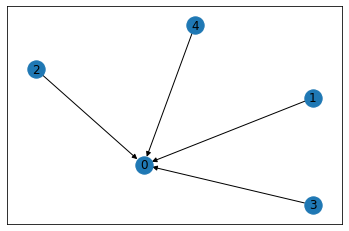

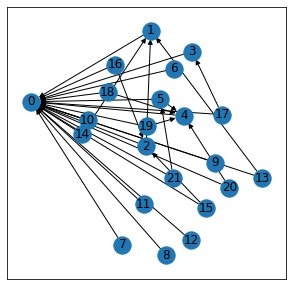

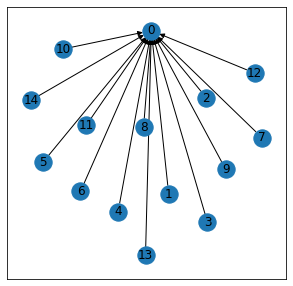

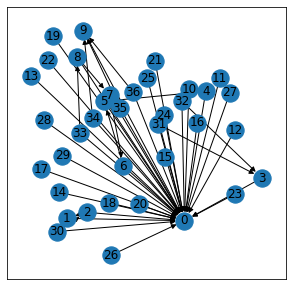

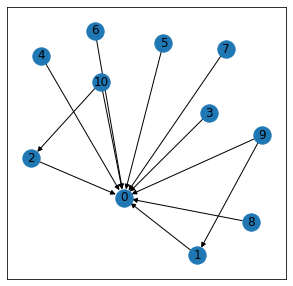

...

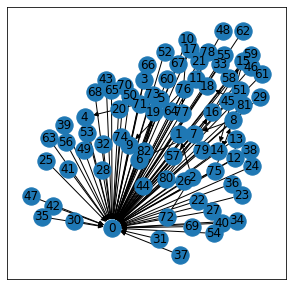

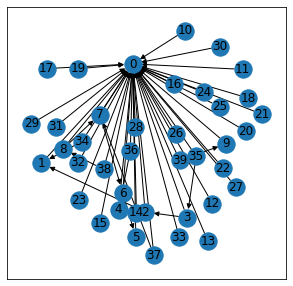

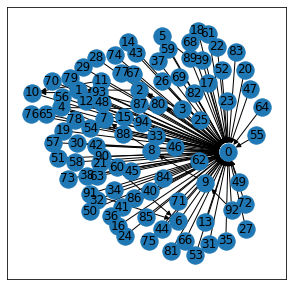

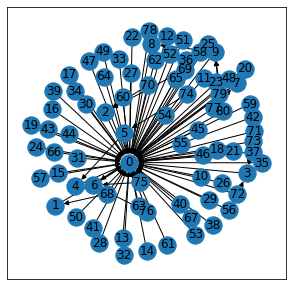

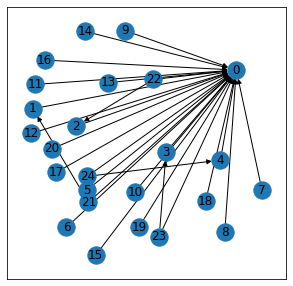

In [82]:
### DICTIO reading, EDGES extraction, call graph for depiction
source_list=[]
target_list=[]
for i in range(len(dictio)):
    sol=dictio[i]['edges'][0]
    tol=dictio[i]['edges'][1]
    graph(sol,tol)

In [83]:
import dgl
import torch
from dgl.data.utils import save_graphs
from torch.utils.data import Dataset, DataLoader

In [84]:
listtest=[498293668655423488, 498486826269548545, 500280249629036544, 500298588992593920, 524923293711998976, 524936793633083394, 524941720249978880,524948206023880704,524961721744900097,
         544274544174071809, 544294893146091520, 544315472075042818, 552788945017516032, 553480082996879360, 553553288625672192,
         553561170637238272, 580352273001410560, 581153923987206146, 581290271997968384, 581359544682614784, 758159624122097664,
         763098277986209792, 764927075522260992, 767725956706414592, 768859780240773121, 769988636754505729, 774991078265094144, 775057555865206784]

In [85]:
len(listtest)

28

In [86]:
listdev=[580319078155468800, 580332109782466561, 580325090367315968, 580339547269144576, 581386094337474560, 
        581473088249958400, 580340476949086208, 580360165540642816, 580321156508577792, 580319184652890113, 
        580348081100734464, 580322453928431617, 580333763512705025, 580333909008871424, 581293286268129280, 
        581047170637381632, 580331561398108160, 580326222107951104, 580882341880446977, 580324027715063808,
        581063377226637312, 580320684305416192, 580339825649291264, 580371845997682688, 580323060533764097]

In [87]:
def collate(samples):
    # The input `samples` is a list of pairs
    #  (graph, label).
    graphs, labels = map(list, zip(*samples))
    batched_graph = dgl.batch(graphs)
    return batched_graph, torch.tensor(labels)

In [88]:
dictio[297]

{'tweet_id': [498293668655423488,
  498313345129529344,
  498313970689011712,
  498314140436684800,
  498314401427251200,
  498293763387568128,
  498293880820076544,
  498293953582866432,
  498293963183652864,
  498293964748124161,
  498294148550885376,
  498294365630910466,
  498294492743483395,
  498294531625091072,
  498294603544801281,
  498294706355601409,
  498294714026983424,
  498295324029747200,
  498295399682441217,
  498297185834786816,
  498297997118435329,
  498298019045847040,
  498298371615244289,
  498298907311767553,
  498299535702368256,
  498299548625018880,
  498299653935603713,
  498300617392406528,
  498303898646347776,
  498304971671343107,
  498305308754591744,
  498307471610744832,
  498309467889729536,
  498312078243819520,
  498318523719229441,
  498320393296289794,
  498330480991670274,
  498334502041956352,
  498314731690946560],
 'node_id': [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  

In [89]:
graphs=[]
for i in range(272):
    
    if dictio[i]['tweet_id'][0] not in listtest:
        sol=dictio[i]['edges'][0]
        tol=dictio[i]['edges'][1]
        embtensor = torch.Tensor(dictio[i]['embeddings'])
        snctensor = torch.Tensor(dictio[i]['stance'])
        snctensor = snctensor.type(torch.int64) # transform tensor items into integers
        #print(snctensor)
        g = dgl.graph((tol, sol)) 
        g.ndata['x']=embtensor
        g.ndata['y']=snctensor
        graphs.append(g)
        #print(g)
save_graphs("./datatrain.bin", graphs)
train_dataloader = DataLoader(graphs, batch_size=100, shuffle=True, collate_fn=collate)

C:\Users\pmona\AppData\Local\Temp/ipykernel_816/3696908543.py:7: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:264.)
  embtensor = torch.Tensor(dictio[i]['embeddings'])


In [90]:
graphs=[]
for i in range(273, 298):
    if dictio[i]['tweet_id'][0] in listtest:
        sol=dictio[i]['edges'][0]
        tol=dictio[i]['edges'][1]
        embtensor = torch.Tensor(dictio[i]['embeddings'])
        
        snctensor = torch.Tensor(dictio[i]['stance'])
        snctensor = snctensor.type(torch.int64) # transform tensor items into integers
        g = dgl.graph((tol, sol)) 
        g.ndata['x']=embtensor
        g.ndata['y']=snctensor
        graphs.append(g)
        #print(g)
save_graphs("./dataval.bin", graphs)
val_dataloader = DataLoader(graphs, batch_size=100, shuffle=True, collate_fn=collate)


In [91]:
graphs=[]
for i in range(298, 325):
    if dictio[i]['tweet_id'][0] in listtest:
        sol=dictio[i]['edges'][0]
        tol=dictio[i]['edges'][1]
        embtensor = torch.Tensor(dictio[i]['embeddings'])
        
        snctensor = torch.Tensor(dictio[i]['stance'])
        snctensor = snctensor.type(torch.int64) # transform tensor items into integers
        g = dgl.graph((tol, sol)) 
        g.ndata['x']=embtensor
        g.ndata['y']=snctensor
        graphs.append(g)
        #print(g)
save_graphs("./datatest.bin", graphs)
test_dataloader = DataLoader(graphs, batch_size=100, shuffle=True, collate_fn=collate)

In [92]:
from dgl.data.utils import load_graphs
train_data = load_graphs("./datatrain.bin")
val_data = load_graphs("./dataval.bin")
test_data = load_graphs("./datatest.bin")

In [93]:
print(train_data[0][271])

Graph(num_nodes=6, num_edges=5,
      ndata_schemes={'x': Scheme(shape=(800,), dtype=torch.float32), 'y': Scheme(shape=(), dtype=torch.int64)}
      edata_schemes={})


In [94]:
#https://docs.dgl.ai/en/0.2.x/tutorials/basics/4_batch.html
import dgl
import numpy as np
import urllib
import pandas as pd

from dgl.data import DGLDataset
from dgl.data.utils import load_graphs

import torch

def collate(samples):
    # The input `samples` is a list of pairs
    #  (graph, label).
    graphs, labels = map(list, zip(*samples))
    batched_graph = dgl.batch(graphs)
    return batched_graph, torch.tensor(labels)

In [95]:
class StanceDataset(DGLDataset):
    def __init__(self, data):
        self.data = data
        super().__init__(name='stance')

    def process(self):
        self.graphs = []
        self.labels = []
        self.labels2 = []
        # For each graph ID...
        for i in range(len(self.data[0])):
            self.graphs.append(self.data[0][i])
            self.labels.append(torch.tensor(1))
        # Convert the label list to tensor for saving.
        self.labels = torch.LongTensor(self.labels)

    def __getitem__(self, i):
        return self.graphs[i], self.labels[i]

    def __len__(self):
        return len(self.graphs)

In [96]:
#from dgl.data.utils import split_dataset

In [97]:
test_dataset = StanceDataset(test_data)
train_dataset = StanceDataset(train_data)
val_dataset = StanceDataset(val_data)

[]
[]
[]


In [99]:
test_dataset[1][0]
gg = test_dataset[1][0]
gg.ndata['y']

tensor([0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1,
        1, 1, 1, 1])

In [101]:
test_dataloader = DataLoader(test_dataset, batch_size=128, shuffle=False, collate_fn=collate)
train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=False, collate_fn=collate)
val_dataloader = DataLoader(val_dataset, batch_size=128, shuffle=False, collate_fn=collate)

In [102]:
from torch.utils.data import Dataset, DataLoader

In [103]:
next(iter(train_dataloader))

(Graph(num_nodes=2247, num_edges=3038,
       ndata_schemes={'x': Scheme(shape=(800,), dtype=torch.float32), 'y': Scheme(shape=(), dtype=torch.int64)}
       edata_schemes={}),
 tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1]))

In [104]:
## G C N     M O D E L 

class GCN(nn.Module):
    def __init__(self, in_feats, h_feats, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GraphConv(in_feats, h_feats)
        self.conv2 = GraphConv(h_feats, h_feats)
        self.conv3 = GraphConv(h_feats, h_feats)
        self.conv4 = GraphConv(h_feats, h_feats)
        self.conv5 = GraphConv(h_feats, num_classes)

       
    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.relu(h)
        h = self.conv2(g, h)
        h = F.relu(h)
        h = self.conv3(g, h)
        h = F.relu(h)
        h = self.conv4(g, h)
        h = F.relu(h)
        h = self.conv5(g, h)

        return h

In [105]:
import torch.nn.functional as F
from lightning.pytorch.callbacks.early_stopping import EarlyStopping

model = GCN(800, 128, 4)
criterion = torch.nn.CrossEntropyLoss()
opt = torch.optim.Adam(model.parameters())

############################
eval_loss= 0
best_eval_loss = 100000
trigger_times = 0
epoch_losses = []
eval_losses = []
for i in range(500):
    epoch_loss = 0
    find = False
    model.train()
    for d, l in train_dataloader:
        d = dgl.add_self_loop(d)
        features = d.ndata['x']
        #print(features)
        labels = d.ndata['y']
        #print(labels)
        logits = model(d,features)        
        pred = logits.argmax(1)   ######################compute predictions
        
        loss = F.cross_entropy(logits,labels)
        epoch_loss += loss.detach().item()
        
        train_acc = (pred == labels).float().mean()########################3
        opt.zero_grad()
        loss.backward()
        opt.step()
        
        
    print('Epoch {}, loss {:.4f}'.format(i, epoch_loss))
    epoch_losses.append(epoch_loss) 
    
    eval_loss = 0
    
    model.eval()
    
    
    ############## VALIDATION ######################
    for d, l in val_dataloader:
        with torch.no_grad():
            d = dgl.add_self_loop(d)
            features = d.ndata['x']
            labels = d.ndata['y']
            logits = model(d,features)
            pred = logits.argmax(1)   ######################compute predictions
            loss = F.cross_entropy(logits,labels)   
            eval_loss += loss.detach().item()
            
       
    
    for d, l in test_dataloader:
        with torch.no_grad():
            d = dgl.add_self_loop(d)
            features = d.ndata['x']
            labels = d.ndata['y']
            logits = model(d,features)
            pred = logits.argmax(1)   ######################compute predictions
            loss = F.cross_entropy(logits,labels)   
            eval_loss += loss.detach().item()
        
            train_acc = (pred == labels).float().mean()########################3
            print('Epoch {}, validation loss {:.4f}'.format(i, eval_loss))
            print()
            eval_losses.append(eval_loss)


        
        if eval_loss > best_eval_loss:
            trigger_times += 1
            print('Trigger Times:', trigger_times)
#         else:
#             print('trigger times: 0')
#             trigger_times = 0
            
            if trigger_times >= 50:
                print('Early stopping!\n')
                find = True
        else:
            trigger_times = 0



        if eval_loss < best_eval_loss:
            print('Yesssssssssssssssssssssssssssssssssssssssssss')
            best_eval_loss = eval_loss
            path = "savedmodel.pth"
            torch.save(model.state_dict(), path)
            #state = {'epoch': epoch_loss,'state_dict': model.state_dict()}
            #savepath='savedmodel.t7'
            #torch.save(state,savepath)
    if find:
        break


C:\Users\pmona\anaconda3\lib\site-packages\dgl\backend\pytorch\tensor.py:445: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  assert input.numel() == input.storage().size(), (


Epoch 0, loss 4.1104
Epoch 0, validation loss 2.6966

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 1, loss 3.9457
Epoch 1, validation loss 2.5927

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 2, loss 3.7269
Epoch 2, validation loss 2.4866

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 3, loss 3.5391
Epoch 3, validation loss 2.4548

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 4, loss 3.4898
Epoch 4, validation loss 2.5283

Trigger Times: 1
Epoch 5, loss 3.5187
Epoch 5, validation loss 2.5437

Trigger Times: 2
Epoch 6, loss 3.5045
Epoch 6, validation loss 2.4789

Trigger Times: 3
Epoch 7, loss 3.4599
Epoch 7, validation loss 2.4196

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 8, loss 3.4309
Epoch 8, validation loss 2.3954

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 9, loss 3.4132
Epoch 9, validation loss 2.3870

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 10, loss 3.3924
Epoch 10, validation loss 2.3768

Yesssssssssssssssssssssssssssss

Epoch 87, loss 2.5757
Epoch 87, validation loss 1.9855

Trigger Times: 2
Epoch 88, loss 2.5603
Epoch 88, validation loss 1.9975

Trigger Times: 3
Epoch 89, loss 2.5745
Epoch 89, validation loss 1.9899

Trigger Times: 4
Epoch 90, loss 2.5621
Epoch 90, validation loss 1.9734

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 91, loss 2.5633
Epoch 91, validation loss 2.0077

Trigger Times: 1
Epoch 92, loss 2.5672
Epoch 92, validation loss 1.9783

Trigger Times: 2
Epoch 93, loss 2.5518
Epoch 93, validation loss 1.9914

Trigger Times: 3
Epoch 94, loss 2.5655
Epoch 94, validation loss 1.9850

Trigger Times: 4
Epoch 95, loss 2.5509
Epoch 95, validation loss 1.9666

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 96, loss 2.5536
Epoch 96, validation loss 2.0007

Trigger Times: 1
Epoch 97, loss 2.5475
Epoch 97, validation loss 1.9641

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 98, loss 2.5458
Epoch 98, validation loss 1.9752

Trigger Times: 1
Epoch 99, loss 2.5433
Epoch 99, valid

Epoch 189, loss 2.3684
Epoch 189, validation loss 1.9034

Trigger Times: 3
Epoch 190, loss 2.3596
Epoch 190, validation loss 1.8651

Trigger Times: 4
Epoch 191, loss 2.3557
Epoch 191, validation loss 1.8459

Trigger Times: 5
Epoch 192, loss 2.3491
Epoch 192, validation loss 1.9221

Trigger Times: 6
Epoch 193, loss 2.3643
Epoch 193, validation loss 1.8837

Trigger Times: 7
Epoch 194, loss 2.3490
Epoch 194, validation loss 1.8582

Trigger Times: 8
Epoch 195, loss 2.3501
Epoch 195, validation loss 1.8812

Trigger Times: 9
Epoch 196, loss 2.3504
Epoch 196, validation loss 1.8785

Trigger Times: 10
Epoch 197, loss 2.3437
Epoch 197, validation loss 1.9218

Trigger Times: 11
Epoch 198, loss 2.3629
Epoch 198, validation loss 1.8394

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 199, loss 2.3443
Epoch 199, validation loss 1.8453

Trigger Times: 1
Epoch 200, loss 2.3539
Epoch 200, validation loss 1.8986

Trigger Times: 2
Epoch 201, loss 2.3486
Epoch 201, validation loss 1.8756

Trigger Tim

In [106]:
model

GCN(
  (conv1): GraphConv(in=800, out=128, normalization=both, activation=None)
  (conv2): GraphConv(in=128, out=128, normalization=both, activation=None)
  (conv3): GraphConv(in=128, out=128, normalization=both, activation=None)
  (conv4): GraphConv(in=128, out=128, normalization=both, activation=None)
  (conv5): GraphConv(in=128, out=4, normalization=both, activation=None)
)

In [107]:
#check for all batches
model.load_state_dict(torch.load("savedmodel.pth"))
model.eval()
with torch.no_grad():
    for d, l in test_dataloader:

        d = dgl.add_self_loop(d)
        features = d.ndata['x']        
        labels = d.ndata['y']
        logits = model(d,features)
        y_pred = logits.argmax(1)  
        print(y_pred)
        print(labels)
        acc = (y_pred == labels).float().mean()
        print(acc)
        acc = (y_pred.round() == labels).float().mean()
        acc = float(acc)
        print("Model accuracy: %.2f%%" % (acc*100))


tensor([0, 1, 1,  ..., 1, 1, 1])
tensor([3, 2, 1,  ..., 1, 1, 1])
tensor(0.7550)
Model accuracy: 75.50%


In [108]:
from sklearn.metrics import f1_score
f1_score(labels, y_pred, average='macro')

0.3675226999479606

In [109]:
import tensorflow as tf
confusion_matrix = tf.math.confusion_matrix(labels, y_pred)

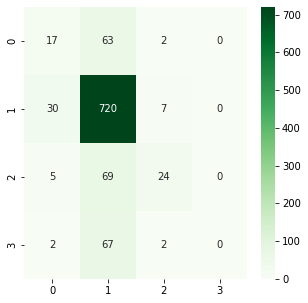

In [110]:
import seaborn as sb
fig = sb.heatmap(confusion_matrix, annot=True, fmt='g', cmap='Greens')

### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY


In [111]:
############################################################################
############################################################################
############################################################################
############################################################################